## Cell Type Classifier

**Goal**: Identify in-vivo cell types in our biological replicate in-vitro model using machine learning.

**Training** : Lundeberg

**Test**: Biological replicates (without Seidman)

**Model Workflow**

1. Independently run scTransform (normalization) and higly variable gene finder on training and test data. (generalizable)
2. Create model learning space by taking intersection of highly variable genes between training and test data. 
3. Train and cross validate cell type classifier using scT normalized data as the learning space.
4. Apply cell type classifier to biological replicates.
5. Model interrogation. 

In [8]:
import glob
import itertools
import collections
import numpy as np
import pandas as pd 
import scanpy as sc 
import seaborn as sns
import scipy
import glob
import scipy.io as sci
import matplotlib.pyplot as plt 


from sklearn import preprocessing
from sklearn.linear_model import LogisticRegression 
from sklearn.model_selection import train_test_split
from sklearn.model_selection import StratifiedShuffleSplit
from sklearn.metrics import confusion_matrix
from sklearn.metrics import precision_score, recall_score
import matplotlib.patches as patches
sc.settings.set_figure_params(dpi=300)

In [10]:
class DataWrangler:
    
    def __init__(self, adata_path, matrix_path):
        self.adata = sc.read(adata_path)
        mtx = sci.mmread(matrix_path)
        del self.adata.raw
        self.adata.raw = self.adata
        self.adata.X = mtx.T
    
    def update_adata(self):
        return self.adata
    
    @staticmethod
    def _create_learning_space(hvg_1, hvg_2):
        return list(set(hvg_1) & set(hvg_2))
    
    @staticmethod
    def create_ml_df(adata, learning_space):
        adata.uns['ml_df'] = pd.DataFrame(adata.X.toarray(), index=adata.obs.index.tolist(), columns=adata.var.index.tolist()).T.loc[learning_space].T
        return adata

In [11]:
class Model:
    
    def __init__(self, adata):
        self.adata = adata
        self.X = self.adata.uns['ml_df']
        self.y = self.adata.obs['celltype'].tolist()
        self.cell_count_dict = dict(collections.Counter(self.y))
     
    def _prop(self, count, labels):
        return str(100 * (count/len(labels)))

    def _create_cv_split_df(self, training_labels):
        celltype_cv_df = pd.DataFrame()
        for k,v in dict(collections.Counter(training_labels)).items():
            celltype_cv_df.at[k, 'split_prop'] =  self._prop(v, training_labels)
            celltype_cv_df.at[k, 'full_prop'] = self._prop(self.cell_count_dict[k], self.y)
        return celltype_cv_df
    
    def _report_accuracy(self, trained_model, X_test, y_test):
        return trained_model.score(X_test, y_test)
    
    def _report_predictions(self, trained_model, X_test):
        return trained_model.predict(X_test)
    
    def _create_trained_model(self, training_model, X_train, y_train):
        return training_model.fit(X_train, y_train)
    
    def _report_n_diff_missclassified(self, prob_df, diff_cut):            
        cell_ids = []
        for cell in prob_df[['true', 'predicted']].iterrows():
            if cell[1]['predicted'] != cell[1]['true']:
                cell_ids.append(cell[0])
                x = prob_df.loc[cell[0]][[cell[1]['predicted'], cell[1]['true']]].tolist()
                if x[0]-x[1] < diff_cut:
                    cell_ids.append(cell)
        return cell_ids
    
    def _report_prob_df(self, trained_model, X_test, y_test, predicted_class):
        prob_df = pd.DataFrame(trained_model.predict_proba(X_test),\
                               columns=trained_model.classes_,\
                               index=X_test.index.tolist())
        prob_df['true'] = y_test
        prob_df['predicted'] = predicted_class
        return prob_df
    
    def _report_avg_class_probs(self, prob_df):
        covar_df = pd.pivot_table(prob_df, columns=['true'])
        average_df = pd.DataFrame(np.diag(covar_df).tolist(), index=list(covar_df), columns=['prob'])
        return average_df

    def _report_confusion_matrix(self, y_true, y_pred, classes):
        return pd.DataFrame(confusion_matrix(y_true, y_pred), index=classes, columns=classes)
    
    def cross_validation(self, cv_model=None, training_model=None):
        x = 0
        cv_dict = {}
        for train_index, test_index in cv_model.split(self.X, self.y):
            from sklearn.preprocessing import StandardScaler

            # Create t
            X_train, X_test = self.X.iloc[train_index], self.X.iloc[test_index]
            X_train_index, X_train_columns = X_train.index, list(X_train)
            X_test_index, X_test_columns = X_test.index, list(X_test)

            y_train, y_test = [self.y[i] for i in train_index], [self.y[i] for i in test_index]
            
            sc = StandardScaler()
            
            X_train = sc.fit_transform(X_train)
            X_train = pd.DataFrame(X_train, index=X_train_index, columns=X_train_columns)
            
            X_test = sc.transform(X_test)
            X_test = pd.DataFrame(X_test, index=X_test_index, columns=X_test_columns)

            # Training splits and model fits
            cv_dict[str(x)+'_props'] = self._create_cv_split_df(y_train) # Need to add index to cv dataframe
            trained_model = self._create_trained_model(training_model, X_train, y_train)
            
            # Accuracies and predictions
            cv_dict[str(x)+'_accuracy'] = self._report_accuracy(trained_model, X_test, y_test)
            predicted_class = self._report_predictions(trained_model, X_test)
            cv_dict[str(x)+'_predictions'] = predicted_class
            
            # Probabilities and averages
            cv_dict[str(x) + '_prob_df'] = self._report_prob_df(trained_model, X_test, y_test, predicted_class)
            cv_dict[str(x) + '_avg_df'] = self._report_avg_class_probs(cv_dict[str(x) + '_prob_df'])
            
            # Missclassification assessment
            cv_dict[str(x) + '_confusion_matrix'] = self._report_confusion_matrix(y_test, predicted_class, trained_model.classes_)
            cv_dict[str(x)+'_n_diff_missclassified_cells'] = self._report_n_diff_missclassified(cv_dict[str(x) + '_prob_df'], 0.10)
            
            x += 1
        
        
        accuracy_list = [cv_dict[k] for k in cv_dict.keys() if k.split('_')[1] == 'accuracy']
        cv_dict['avg_accuracy'] = sum(accuracy_list)/len(accuracy_list)
        
        self.adata.uns['cv_report'] = cv_dict
        
        
        return self.adata
    
    def fit_all_data(self, training_model=None):
        trained_model = training_model.fit(self.X, self.y)
        self.adata.uns['trained_model'] = trained_model
        return self.adata

In [12]:
class TrainingInterrogation:
    
    def __init__(self, adata, n):
        self.adata = adata
        self.model = self.adata.uns['trained_model']
        self.n = n
#         self.chd_genes = chd_genes
        
    def _n_elements(self, coefficient_list): 
        final_list = [] 
        for i in range(0, self.n):  
            max1 = 0
            for j in range(len(coefficient_list)):      
                if coefficient_list[j] > max1: 
                    max1 = coefficient_list[j];   
            coefficient_list.remove(max1); 
            final_list.append(max1) 
        return final_list
    
    def _print_model_n_genes(self):
        celltype_list = []
        for gene_importance in zip(self.model.classes_, self.model.coef_):
#             top_n_gene_weights = self._n_elements(gene_importance[1].tolist())
            gene_weights = gene_importance[1]
#     [np.exp(items) for items in gene_importance[1]]
#         if value in top_n_gene_weights
            gene_indices = [index for index, value in enumerate(gene_importance[1])]
            genes = [value for index,value in enumerate(list(self.adata.uns['ml_df'])) if index in gene_indices]
            print(gene_importance[0])
#             print(gene_weights)
            gene_list = list(zip(genes, gene_weights))
            sorted_gene_list = sorted(gene_list, key = lambda x: x[1], reverse=True)
            print('Top 10 genes')
#             print(gene_list[:10], '\n')
#             print(gene_list[-10:], '\n')

            print([x[0] for x in sorted_gene_list][:30], '\n')
            print([x[0] for x in sorted_gene_list].index('KCNA5'))
            print('Bottom 10 genes')
            print([x[0] for x in sorted_gene_list][-30:], '\n')
            print('############################')

            
#             print(genes, '\n')
# #             genes = [gene for gene in genes if gene in self.chd_genes]

#             if str(gene_importance[0]) == 'Capillary endothelium/pericytes/adventia':
#                 rename = 'capillary_endo_pericytes_adventia'
            
#                 df = pd.DataFrame(gene_weights, index=genes, columns=[rename])
# #                 genes = [gene for gene in genes if gene in self.chd_genes]
# #                 df = df.loc[genes,:]
#                 df.to_csv('classifier_supplement/' + rename + "_gene_weights.csv")
            
#             elif str(gene_importance[0]) == 'Smooth muscle cells/fibroblast-like':
#                 rename = 'smooth_muscle_and_fibro_like'
#                 df = pd.DataFrame(gene_weights, index=genes, columns=[rename])
# #                 genes = [gene for gene in genes if gene in self.chd_genes]
# #                 df = df.loc[genes,:]
#                 df.to_csv('classifier_supplement/' + rename + "_gene_weights.csv")

#             else:
#                 df = pd.DataFrame(gene_weights, index=genes, columns=[str(gene_importance[0])])

# #                 genes = [gene for gene in genes if gene in self.chd_genes]
# #                 df = df.loc[genes,:]
#                 df.to_csv('classifier_supplement/' +  str(gene_importance[0])+"_gene_weights.csv")
# #             celltype_list.append()

# #             print('\n')
        return celltype_list
    
    def run(self):
        self._print_model_n_genes()

In [702]:
chd_df = pd.read_excel('CHDgenes.xlsx')
chd_genes = chd_df['Congenital Heart Disease'].tolist()

In [94]:
# TrainingInterrogation(lunde, 50).run()

In [711]:
# celltype_list = TrainingInterrogation(lunde, len(learning_space), chd_genes).run()

In [5]:
class InvestigateTestData:
    
    def __init__(self, model=None, test_data=None):
        self.model = model
        self.adata = test_data
    
    def _make_predictions(self):
        return self.model.predict(self.adata.uns['ml_df'])
    
    def _create_prob_df(self, predictions):
        prob_df = pd.DataFrame(self.model.predict_proba(self.adata.uns['ml_df']),\
                            columns=self.model.classes_, index=self.adata.uns['ml_df'].index.tolist())
        self.adata.obs['probs'] = [max(data) for data in prob_df.values]
        prob_df['predictions'] = predictions
        prob_df['niceorder'] = self.adata.obs['niceorder']
        return prob_df
    
    def _create_average_df(self):
        covar_df = pd.pivot_table(self.adata.uns['prob_df'], columns=['predictions'])
        average_df = pd.DataFrame(np.diag(covar_df).tolist(), index=list(covar_df), columns=['prob'])
        self.adata.uns['avg'] = average_df
    
    @staticmethod
    def create_celltype_df(adata):
        
        celltype_df = pd.DataFrame()
        
        # Class proportions
        for k,v in collections.Counter(adata.obs['predictions']).items():
            celltype_df.at[k, 'count'] = v
            celltype_df.at[k, 'total_percent'] = 100 * (v/adata.obs.shape[0])
            
        # Genotype class
        prob_df = adata.uns['prob_df']
        prob_df = prob_df[prob_df.index.isin(adata.obs.index.tolist())]
        geno_dict = dict(collections.Counter(adata.obs['niceorder'].tolist()))
        for k,v in dict(collections.Counter([tuple(items) for items in prob_df[['niceorder','predictions']].values])).items():
            celltype_df.at[k[1], k[0]] = v
            celltype_df.at[k[1], k[0]+'_percent'] =  100 * v/geno_dict[k[0]]
        
        return celltype_df

    def _check_for_missing_celltypes(self):
        self.adata.uns['missing_celltypes'] = [celltypes for celltypes in \
                                               [items for items in list(self.model.classes_) \
                                                if items not in list(set(self.adata.uns['predictions']))]]
    
    def _update_adata(self, prob_df, predictions):
        self.adata.uns['prob_df'] = prob_df
        self.adata.obs['predictions'] = predictions
        self._create_average_df()
        self.adata.uns['celltype_df'] = InvestigateTestData.create_celltype_df(self.adata)
    
    def run(self):
        predictions = self._make_predictions()
        prob_df = self._create_prob_df(predictions)
        self._update_adata(prob_df, predictions)
        return self.adata

## Data Wrangling

### 1. scTransform and HVG was ran in Seurat, now we will format the data for an adata object.
### 2. Create model learning space by taking intersection of highly variable genes between training and test data. 

In [13]:
biorep = DataWrangler('../Data/scanpy_1.4.5.post1/biorep_int_by_rep.h5ad', '../Data/scanpy_1.4.5.post1/biorep_int_by_rep.mtx').update_adata()
biorep.X = scipy.sparse.csr_matrix(biorep.X)
lunde = DataWrangler('../../CardiacCompendium/Data/human/Lundeberg/scanpy/scRNAseq_ST.h5ad',\
                     '../../CardiacCompendium/Data/human/Lundeberg/scanpy/scRNAseq_ST.mtx').update_adata()

lunde_genes = pd.read_csv('../../CardiacCompendium/Data/human/Lundeberg/scanpy/scRNAseq_ST_hvgs.csv')

In [7]:
# Create learning space 
learning_space = DataWrangler._create_learning_space(biorep.var.index.tolist(),lunde_genes['x'].tolist())

In [8]:
print(len(learning_space))

1538


In [8]:
collections.Counter(lunde.obs[lunde.obs['res.0.7'].isin(['9'])]['celltype'].tolist())

Counter({'Subepicardial cells': 128})

In [8]:
# Create machine learning dataframes
biorep = DataWrangler.create_ml_df(biorep, learning_space)
lunde = DataWrangler.create_ml_df(lunde, learning_space)

## 3. Train and cross validate cell type classifier using scT normalized data as the learning space. 

**Cross validation technique**: Stratified ShuffleSplit cross-validator

In [20]:
sss = StratifiedShuffleSplit(n_splits=10, test_size=0.5, random_state=0)
lr = LogisticRegression(multi_class="multinomial",solver="lbfgs", C=9, max_iter=1500, random_state=42)

In [21]:
lunde = Model(lunde).cross_validation(cv_model = sss, training_model = lr)

In [22]:
lunde = Model(lunde).fit_all_data(training_model = lr)



## 4. Apply cell type classifier to biological replicates.


What are the odds of a Het classified as fibroblast, how does that change with respect to WT being classified as fibroblast-like?

* var1 = prediction of each cell

* var2 = For each cell what is it's underlying genotype

* GLM, setting family to binomial 

* 3 coefficients- intercept, 2 other log odd ratios (het vs wt and hom vs wt) a

In [23]:
biorep = InvestigateTestData(model=lunde.uns['trained_model'], test_data=biorep).run()

In [44]:
meta = pd.read_csv('biorep_meta_v2.csv', index_col=[0])
biorep.obs = meta

/opt/conda/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3051: DtypeWarning: Columns (8) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [88]:
biorep.obs.to_csv('biorep_meta_v2.csv')

In [192]:
biorep.obs[biorep.obs['predictions'].isin(['Atrial cardiomyocytes', 'Ventricular cardiomyocytes'])][['predictions', 'geno_rep']].to_csv('biorep_aCM_vCM_preds.csv')

In [202]:
# biorep[biorep.obs.index.isin([cell for cell in biorep.uns['prob_df'].index.tolist() if biorep.uns['prob_df'].at[cell, biorep.uns['prob_df'].loc[cell]['predictions']] > 0.70])]['predictions']

In [197]:
biorep[biorep.obs.index.isin([cell for cell in biorep.uns['prob_df'].index.tolist() if biorep.uns['prob_df'].at[cell, biorep.uns['prob_df'].loc[cell]['predictions']] > 0.70])].obs[['predictions','probs', 'geno_rep']].to_csv('biorep_aCM_vCM_preds.csv')

In [87]:
InvestigateTestData.create_celltype_df(biorep)

,count,total_percent,WT,WT_percent,Control,Control_percent,Het,Het_percent,Homo,Homo_percent
Fibroblast-like,4313.0,22.824936,1293.0,22.027257,614.0,28.242870,867.0,17.274357,1537.0,26.350077
Ventricular cardiomyocytes,9670.0,51.174852,3361.0,57.257240,854.0,39.282429,2886.0,57.501494,2601.0,44.591119
Subepicardial cells,1116.0,5.906012,678.0,11.550256,54.0,2.483901,176.0,3.506675,206.0,3.531630
Atrial cardiomyocytes,1746.0,9.240051,394.0,6.712095,63.0,2.897884,463.0,9.224945,797.0,13.663638
Capillary endothelium/pericytes/adventia,86.0,0.455123,20.0,0.340716,12.0,0.551978,20.0,0.398486,31.0,0.531459
Smooth muscle cells/fibroblast-like,77.0,0.407494,17.0,0.289608,10.0,0.459982,36.0,0.717274,15.0,0.257158
Erythrocytes,251.0,1.328323,46.0,0.783646,42.0,1.931923,43.0,0.856744,117.0,2.005829
Immune cells,40.0,0.211685,12.0,0.204429,1.0,0.045998,4.0,0.079697,24.0,0.411452
Capillary endothelium,253.0,1.338908,29.0,0.494037,31.0,1.425943,60.0,1.195457,131.0,2.245843
Cells related to cardiac neural crest,1339.0,7.086156,17.0,0.289608,493.0,22.677093,463.0,9.224945,373.0,6.394651


In [45]:
InvestigateTestData.create_celltype_df(biorep[biorep.obs.index.isin([cell for cell in biorep.uns['prob_df'].index.tolist() if biorep.uns['prob_df'].at[cell, biorep.uns['prob_df'].loc[cell]['predictions']] > 0.70])])

,count,total_percent,WT,WT_percent,Control,Control_percent,Het,Het_percent,Homo,Homo_percent
Fibroblast-like,3574.0,22.952925,1145.0,21.888740,456.0,27.175209,682.0,15.942029,1291.0,29.447993
Ventricular cardiomyocytes,8854.0,56.862115,3174.0,60.676735,797.0,47.497020,2713.0,63.417485,2170.0,49.498175
Subepicardial cells,942.0,6.049708,595.0,11.374498,46.0,2.741359,138.0,3.225806,163.0,3.718066
Atrial cardiomyocytes,1268.0,8.143343,289.0,5.524756,50.0,2.979738,360.0,8.415147,569.0,12.979015
Capillary endothelium/pericytes/adventia,45.0,0.288999,7.0,0.133818,8.0,0.476758,18.0,0.420757,12.0,0.273723
Capillary endothelium,80.0,0.513776,6.0,0.114701,10.0,0.595948,19.0,0.444133,45.0,1.026460
Smooth muscle cells/fibroblast-like,28.0,0.179821,5.0,0.095584,4.0,0.238379,17.0,0.397382,2.0,0.045620
Cardiomyocytes,5.0,0.032111,3.0,0.057350,NaN,NaN,1.0,0.023375,1.0,0.022810
Cells related to cardiac neural crest,745.0,4.784535,5.0,0.095584,299.0,17.818832,324.0,7.573633,117.0,2.668796
Erythrocytes,30.0,0.192666,2.0,0.038234,8.0,0.476758,6.0,0.140252,14.0,0.319343


In [27]:
InvestigateTestData.create_celltype_df(biorep[biorep.obs.index.isin([cell for cell in biorep.uns['prob_df'].index.tolist() if biorep.uns['prob_df'].at[cell, biorep.uns['prob_df'].loc[cell]['predictions']] > 0.70])])

,count,total_percent,WT,WT_percent,Control,Control_percent,Het,Het_percent,Homo,Homo_percent
Fibroblast-like,3596.0,23.043896,1150.0,21.946565,459.0,27.208062,688.0,16.067258,1299.0,29.549591
Ventricular cardiomyocytes,8836.0,56.622877,3172.0,60.534351,797.0,47.243628,2706.0,63.194769,2161.0,49.158326
Subepicardial cells,941.0,6.030119,595.0,11.354962,46.0,2.726734,137.0,3.199440,163.0,3.707916
Atrial cardiomyocytes,1285.0,8.234540,294.0,5.610687,52.0,3.082395,364.0,8.500701,575.0,13.080073
Capillary endothelium/pericytes/adventia,47.0,0.301186,8.0,0.152672,8.0,0.474215,18.0,0.420364,13.0,0.295723
Capillary endothelium,81.0,0.519064,6.0,0.114504,10.0,0.592768,19.0,0.443718,46.0,1.046406
Smooth muscle cells/fibroblast-like,28.0,0.179430,5.0,0.095420,4.0,0.237107,17.0,0.397011,2.0,0.045496
Cardiomyocytes,5.0,0.032041,3.0,0.057252,NaN,NaN,1.0,0.023354,1.0,0.022748
Cells related to cardiac neural crest,754.0,4.831785,5.0,0.095420,303.0,17.960877,326.0,7.613265,120.0,2.729754
Erythrocytes,32.0,0.205062,2.0,0.038168,8.0,0.474215,6.0,0.140121,16.0,0.363967


## 5. Cross Validation Assessment

1) Sum confusion matrices across cross validation splits

2) Compute error analysis 

3) Compute accuracy, recall, and precision

## 5.1 Sum confusion matrices across validation splits

In [121]:
confusion_matrix_sum = sum([lunde.uns['cv_report'][report] for report in lunde.uns['cv_report'].keys() if report.split('_')[1] == 'confusion'])

In [122]:
confusion_matrix_sum = confusion_matrix_sum[['Ventricular cardiomyocytes', 'Atrial cardiomyocytes', 'Cardiomyocytes',\
                     'Fibroblast-like', 'Subepicardial cells', 'Cells related to cardiac neural crest',\
                     'Smooth muscle cells/fibroblast-like', 'Capillary endothelium/pericytes/adventia', 'Capillary endothelium',\
                     'Erythrocytes', 'Immune cells']]
confusion_matrix_sum = confusion_matrix_sum.reindex(['Ventricular cardiomyocytes', 'Atrial cardiomyocytes', 'Cardiomyocytes',\
                     'Fibroblast-like', 'Subepicardial cells', 'Cells related to cardiac neural crest',\
                     'Smooth muscle cells/fibroblast-like', 'Capillary endothelium/pericytes/adventia', 'Capillary endothelium',\
                     'Erythrocytes', 'Immune cells'])

In [32]:
# for k,v in dict(collections.Counter(lunde.obs['celltype'])).items():
#     print(k, round(100 * v/len(lunde.obs['celltype'].tolist())))

In [31]:
# test = biorep.obs[biorep.obs['niceorder'].isin(['WT'])]

# for k,v in dict(collections.Counter(test['predictions'])).items():
#     print(k, round(100 * v/len(test['predictions'].tolist())))

In [30]:

# for k,v in dict(collections.Counter(biorep.obs['predictions'])).items():
#     print(k, round(100 * v/len(biorep.obs['predictions'].tolist())))

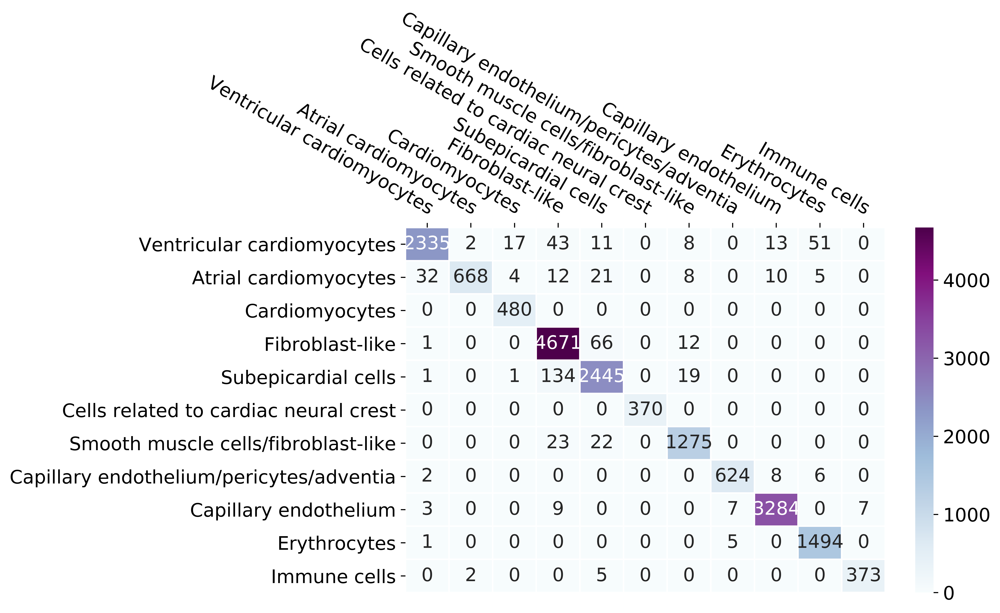

In [556]:
f, ax = plt.subplots(figsize=(8, 5))
cmap = sns.diverging_palette(200, 275, s=80, l=50, n=4)
# BuPu
#cmap=sns.cubehelix_palette(300, start=200, rot=0, dark=0, light=.95, reverse=True)
sns.heatmap(confusion_matrix_sum, annot=True, fmt="d", linewidths=1, cmap='BuPu')
ax.xaxis.tick_top()
plt.setp(ax.get_xticklabels(), rotation=-30, ha="right",
             rotation_mode="anchor")
# plt.show()
plt.savefig('classifier_supplement/cross_validation_confusion_matrix.pdf',bbox_inches='tight')

In [557]:
confusion_matrix_sum = confusion_matrix_sum.transpose()

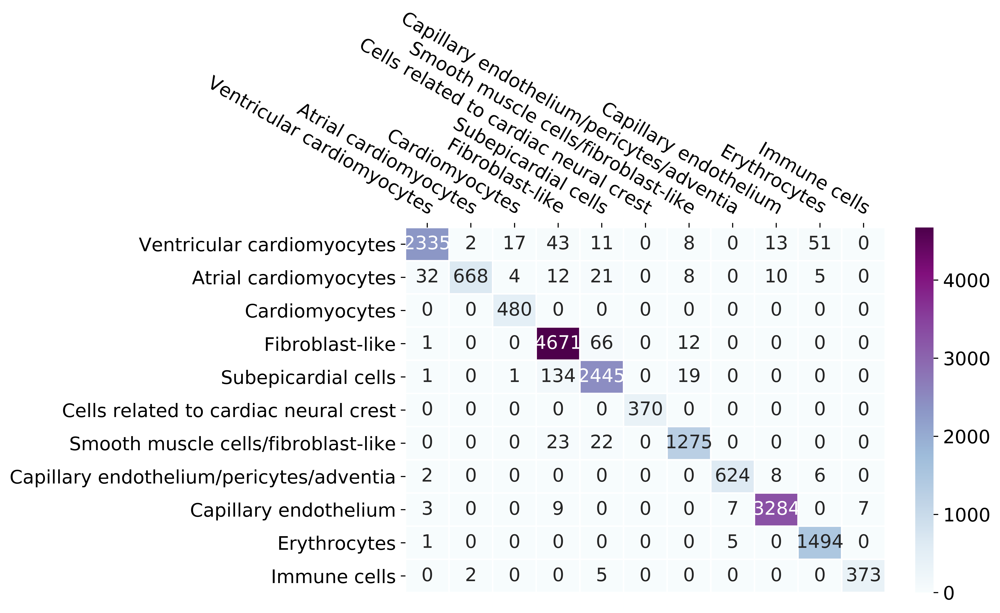

In [124]:
f, ax = plt.subplots(figsize=(8, 5))
cmap = sns.diverging_palette(200, 275, s=80, l=50, n=4)
# BuPu
#cmap=sns.cubehelix_palette(300, start=200, rot=0, dark=0, light=.95, reverse=True)
sns.heatmap(confusion_matrix_sum, annot=True, fmt="d", linewidths=1, cmap='BuPu')
ax.xaxis.tick_top()
plt.setp(ax.get_xticklabels(), rotation=-30, ha="right",
             rotation_mode="anchor")
plt.show()
# plt.savefig('classifier_supplement/cross_validation_confusion_matrix.pdf',bbox_inches='tight')

## 5.2) Compute error rate estimates

In [372]:
row_sums = confusion_matrix_sum.values.sum(axis=1, keepdims=True)
norm_conf_mx = confusion_matrix_sum.values / row_sums

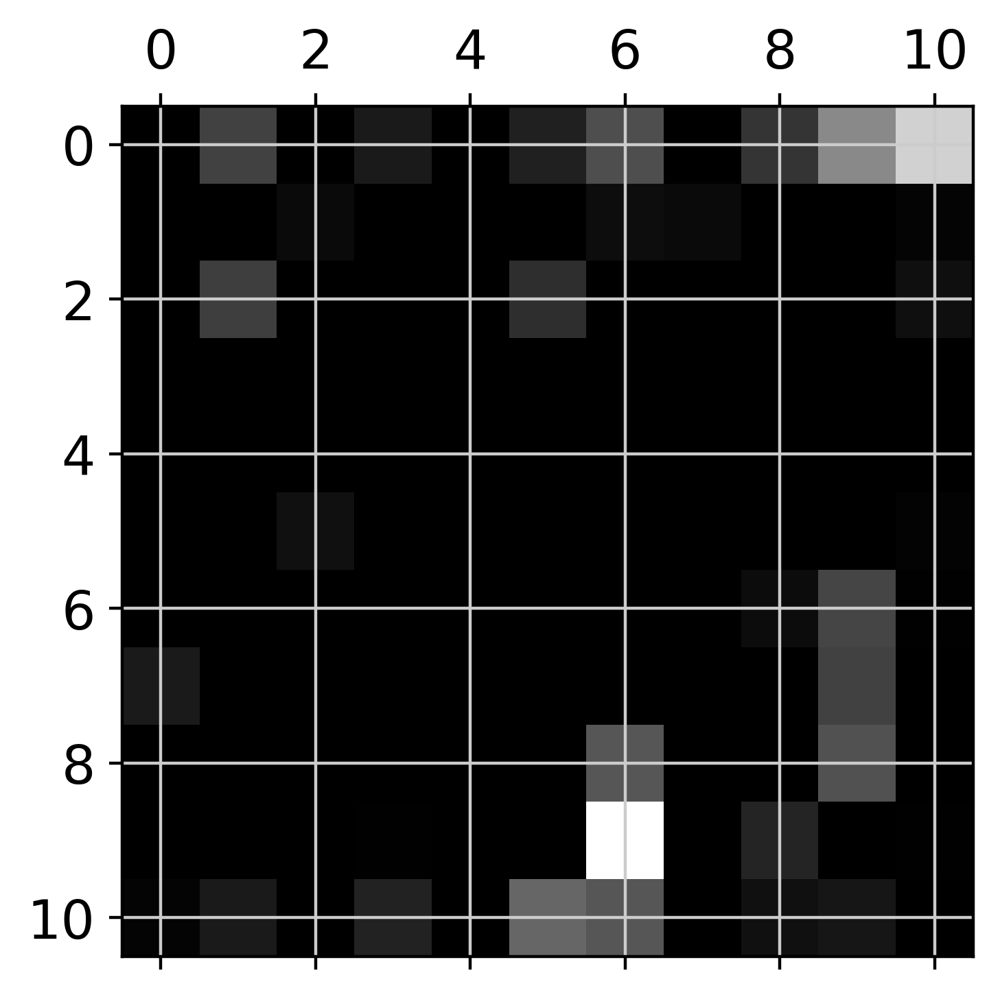

In [374]:
np.fill_diagonal(norm_conf_mx, 0)
plt.matshow(norm_conf_mx, cmap=plt.cm.gray)
plt.show()

## 5.3) Compute accuracy, recall, and precision

In [459]:
rc_list = []
pr_list = []
f1_list = []
for report in lunde.uns['cv_report'].keys():
    if report.split('_')[1] == 'confusion':
        cm = lunde.uns['cv_report'][report].values
        
        recall = np.diag(cm) / np.sum(cm, axis = 1)
        precision = np.diag(cm) / np.sum(cm, axis = 0)
        
        # rc_list.append(np.mean(recall))
        # pr_list.append(np.mean(precision))
        
        rc_list.append(recall)
        pr_list.append(precision)
        
        f1 = [2 * ((stat[0] * stat[1])/(stat[0] + stat[1])) for stat in zip(precision, recall)]
        f1_list.append(f1)

In [513]:
classifier_dict = {'Recall' : pd.DataFrame(rc_list, columns=list(confusion_matrix_sum)),\
 'Precision' : pd.DataFrame(pr_list, columns=list(confusion_matrix_sum)),\
 'F1' : pd.DataFrame(f1_list, columns=list(confusion_matrix_sum))}

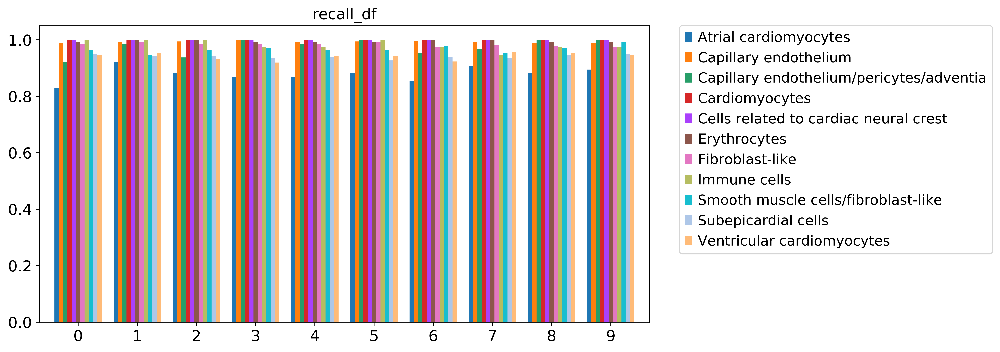

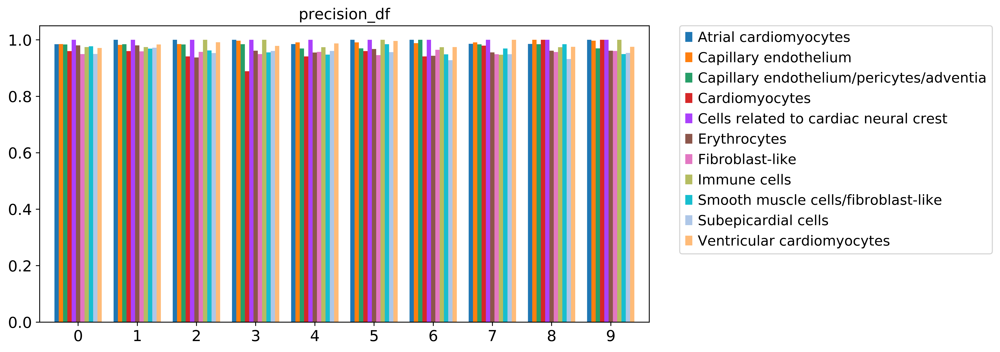

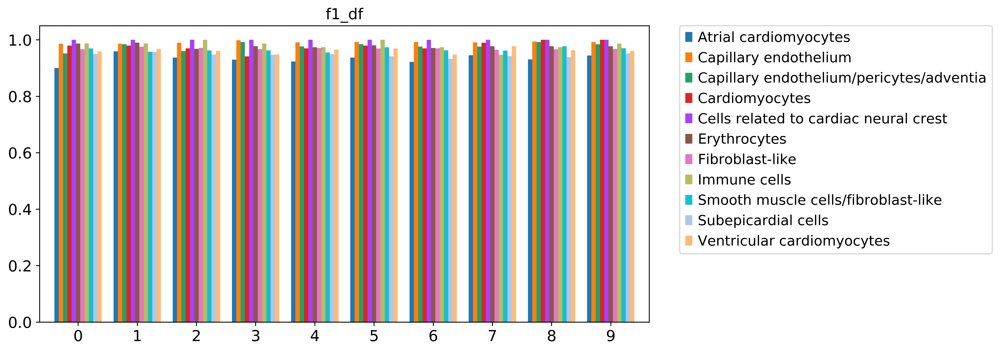

In [549]:
for k,v in classifier_dict.items():
    ax = v.plot.bar(rot=0, figsize=(10,5), width=0.8)
    ax.grid(False)
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
    plt.title(k)

In [375]:
cm = confusion_matrix_sum.values
recall = np.diag(cm) / np.sum(cm, axis = 1) # columns
precision = np.diag(cm) / np.sum(cm, axis = 0) # rows

In [560]:
print(lunde.uns['cv_report']['avg_accuracy'])

0.969284561592254


In [559]:
print(np.mean(recall))
print(np.mean(precision))

0.9740374112282448
0.9787787704617734


In [378]:
2 * (np.mean(precision) * np.mean(recall))/ (np.mean(precision) + np.mean(recall))

0.9714641142312928

## 5. Model Investigation

### 5.1 Waterfall Plot

In [28]:
def _sort_plotting_df(adata, ct, sample, boolean=False):
    plot_df = adata.uns['prob_df'].sort_values(ct, ascending=boolean)
    plot_df = plot_df[plot_df['predictions'].isin([ct])]
    plot_df = plot_df[plot_df['niceorder'].isin([sample])]
    return plot_df
    

def _sorter(prob_df, ct):
#     prob_df = prob_df.loc[[cell for cell in prob_df.index.tolist() if prob_df.at[cell, prob_df.loc[cell]['predictions']] >= 0.49]]
    cell_list = []
    mixed_cells = []
#     cell_id_and_type = []
    for cell in prob_df.index.tolist():
#         if prob_df.at[cell, prob_df.loc[cell]['predictions']] < 0.70:
        comparison_list = [combo for combo in list(itertools.combinations(prob_df.loc[cell].index.tolist()[:-2],2)) \
                           if prob_df.loc[cell]['predictions'] in combo]
        ordered_combo_list = [list(reversed(combo)) if combo[0] != prob_df.loc[cell]['predictions'] else list(combo) for combo in comparison_list]
        for comparison in ordered_combo_list:
            if comparison[1] == ct:
                diff = prob_df.at[cell, comparison[0]] - prob_df.at[cell, comparison[1]]
                if diff > 0.90:
                    cell_list.append(cell)
                if diff < 0.90:
                    mixed_cells.append(cell)
    return cell_list, mixed_cells


def _create_bars(fig, ax, adata, ct_one, ct_two, sample, color_one, color_two, linewidth, boolean=False):
    
    plot_df = _sort_plotting_df(adata, ct_one, sample, boolean)
    t = np.arange(0.0, len(plot_df.index.tolist()), 1)

    cell_list, mixed_cells = _sorter(plot_df, ct_two)
    plot_df['t'] = t
    test = plot_df.loc[cell_list]
    plot_df_min = test[test[ct_one] == test[ct_one].min()]
    plot_df_max = test[test[ct_one] == test[ct_one].max()]
    
    a = [plot_df_max['t'].values[0],0]
    b = [0, plot_df_max[ct_one].values[0]]
    c = [plot_df_min['t'].values[0], 0]
    d = [plot_df_min['t'].values[0], plot_df_max[ct_one].values[0]]
    
    width = c[0] - a[0]
    height = d[1] - a[1]
    
#     rect = patches.Rectangle((0,0),\
#                              width, height, linewidth=1,edgecolor='black',facecolor='none', zorder=2)
    ax.vlines(t, [0], plot_df[ct_one], linewidth=linewidth, color=color_one, alpha=0.4,zorder=1)
    ax.vlines(t, [0], [-1 * (x) for x in plot_df[ct_two]], linewidth=linewidth, color=color_two, alpha=0.4,zorder=1)
#     ax.add_patch(rect)
    ax.vlines(plot_df_min['t'].values[0], 0,1,transform=ax.get_xaxis_transform(), colors='black',\
          linewidth=2, linestyle='dashed')
    return plot_df, mixed_cells

def _create_bars_two(ax, og_plot_df, adata, ct_one, ct_two, sample, color_one, color_two, linewidth, boolean=False):
    plot_df = _sort_plotting_df(adata, ct_one, sample, boolean)
    t = np.arange(len(og_plot_df.index.tolist()), len(plot_df.index.tolist()) + len(og_plot_df.index.tolist()), 1)
    
    cell_list, mixed_cells = _sorter(plot_df, ct_two)
    plot_df['t'] = t
    test = plot_df.loc[cell_list]
    
    plot_df_min = test[test[ct_one] == test[ct_one].min()]
    plot_df_max = test[test[ct_one] == test[ct_one].max()]
    
    a = [plot_df_min['t'].values[0],0]
    b = [0, plot_df_max[ct_one].values[0]]
    c = [plot_df_max['t'].values[0], 0]
    d = [plot_df_max['t'].values[0], plot_df_max[ct_one].values[0]]
    
    width = c[0] - a[0]
    height = d[1] - a[1]
    
#     rect = patches.Rectangle((a[0],0),\
#                              width, -height, linewidth=1,edgecolor='black',facecolor='none', zorder=2)

    ax.vlines(t, [0], plot_df[ct_two],linewidth=linewidth, color=color_two, zorder=1)
    ax.vlines(t, [0], [-1 * (x) for x in plot_df[ct_one]],linewidth=linewidth, color=color_one, zorder=1)
#     ax.add_patch(rect)
    
    ax.vlines(plot_df_min['t'].values[0], 0,1,transform=ax.get_xaxis_transform(), colors='black',\
              linewidth=2, linestyle='dashed')

#     ax.vlines(len(og_plot_df.index.tolist()), 0, 1, transform=ax.get_xaxis_transform(), colors='black',\
#               linewidth=2, linestyle='dashed')
    return mixed_cells

def waterfall_plot(adata, ct_one, ct_two, color_one, color_two, linewidth):
    mixed_cells = {'rep_1':[], 'rep_2':[]}
    for sample in set(list(adata.obs['niceorder'])):
        fig, ax = plt.subplots()
        
        plot_df, mixed_cells_1 = _create_bars(fig, ax, adata, ct_one, ct_two, sample, color_one, color_two, linewidth)
        mixed_cells['rep_2'].append(mixed_cells_1)

        mixed_cells_2 = _create_bars_two(ax, plot_df, adata, ct_two, ct_one, sample, color_two, color_one, linewidth, boolean=True)
        mixed_cells['rep_2'].append(mixed_cells_2)
        
        ax.set_title(sample)
        plt.grid(b=None)
        ax.spines['right'].set_visible(False)
        ax.spines['top'].set_visible(False)
        bottom, top = ax.set_ylim(-1.1, 1.1)
        sample_df = adata.obs[adata.obs['niceorder'].isin([sample])]
        sample_celltype = sample_df[sample_df['predictions'].isin([ct_one, ct_two])].index.tolist()
        left, right = ax.set_xlim(0, len(sample_celltype))
        plt.savefig(sample+'_waterfall_plot.pdf', dpi=600)
    
    return mixed_cells

In [181]:
# All ventricular and atrial
# biorep.obs[biorep.obs['predictions'].isin(['Ventricular cardiomyocytes', 'Atrial cardiomyocytes'])]

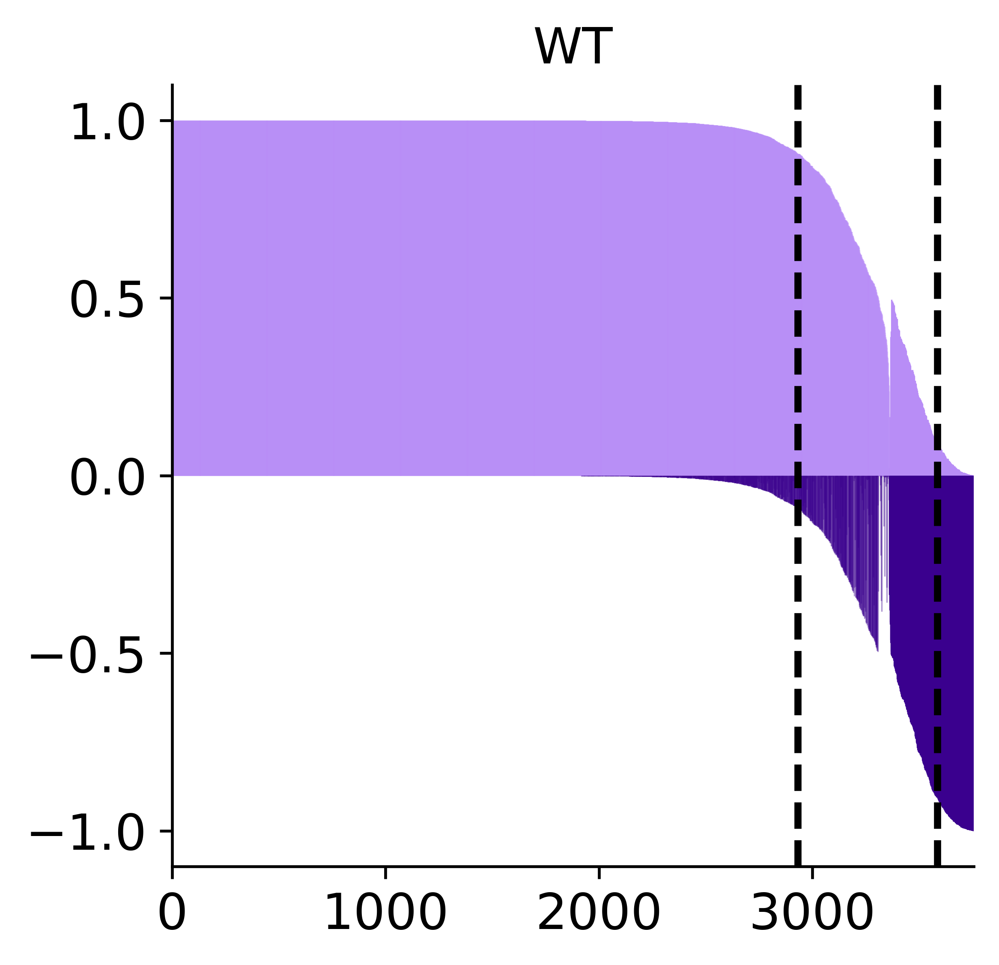

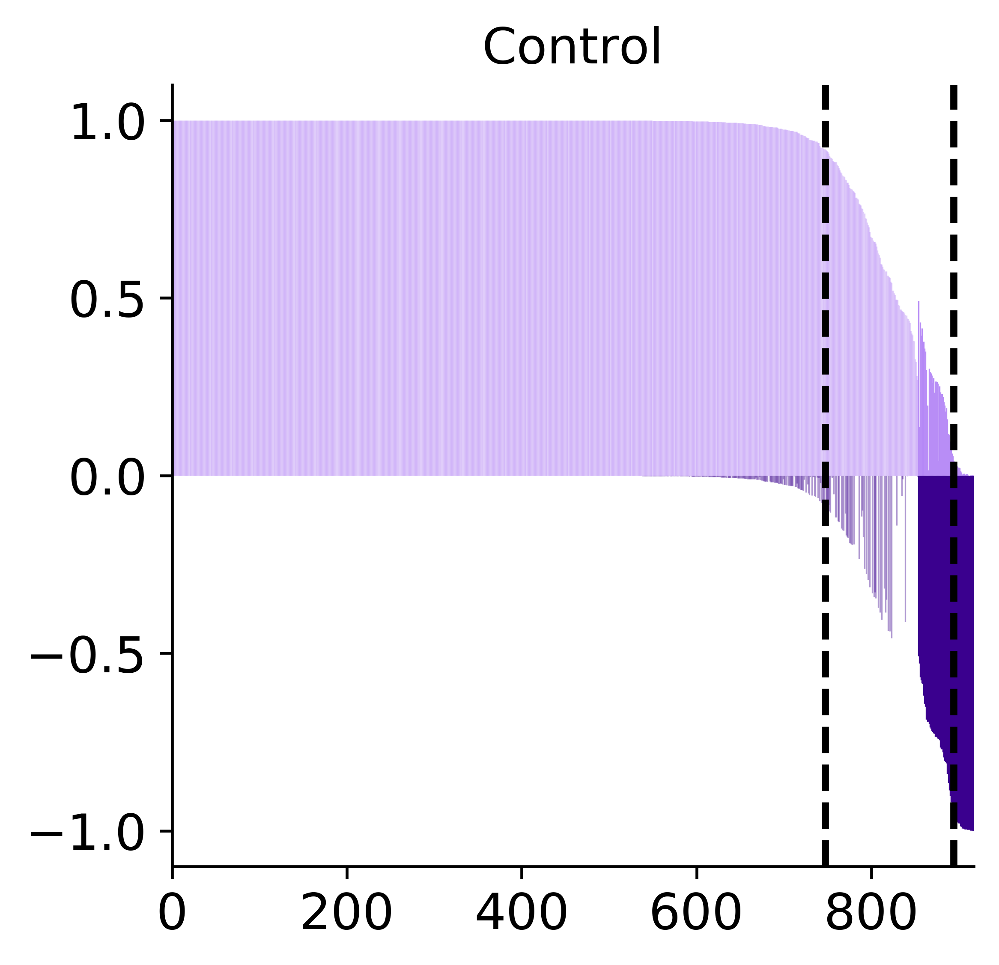

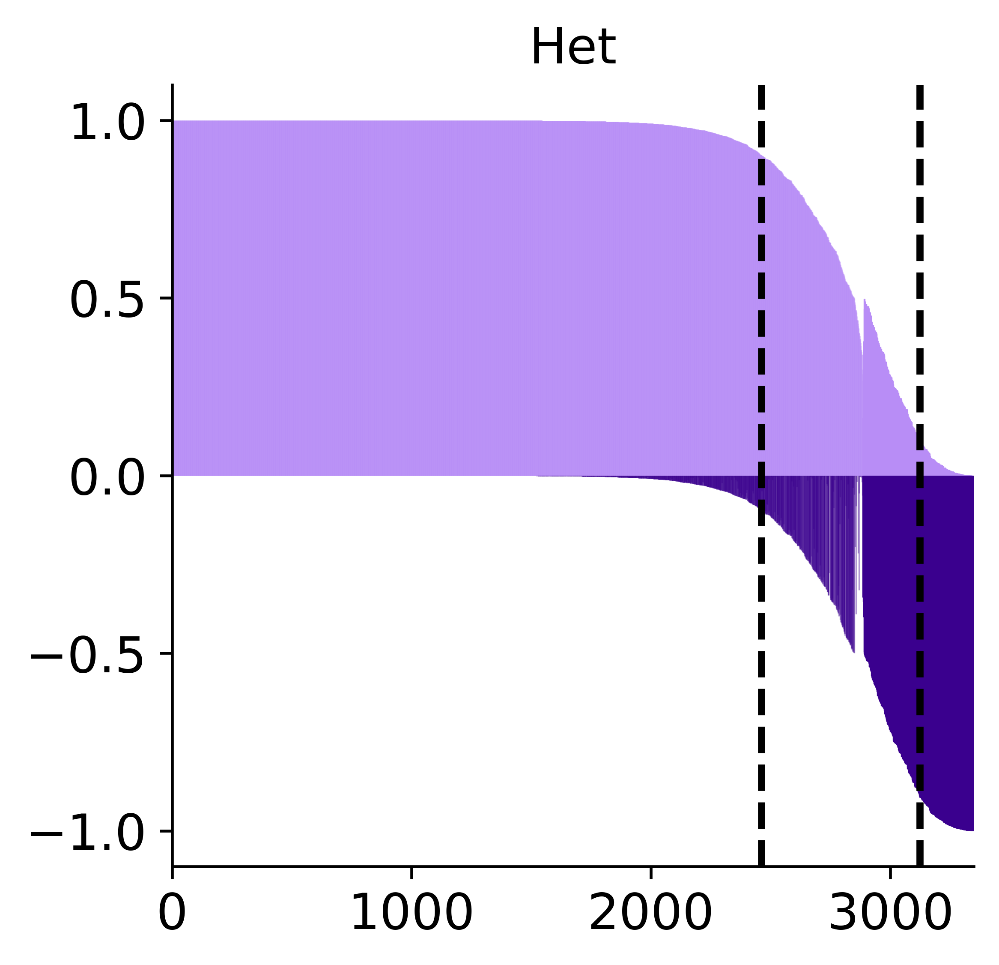

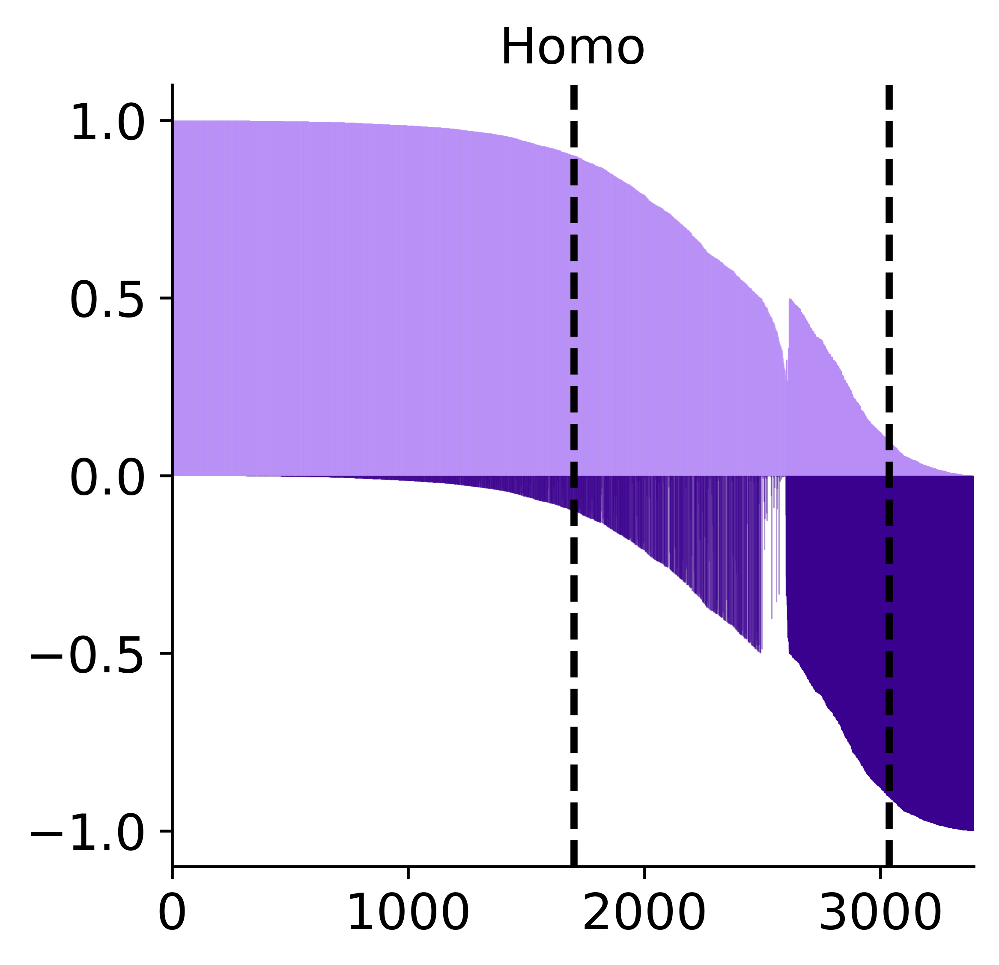

In [30]:
mixed_cells = waterfall_plot(biorep, 'Ventricular cardiomyocytes',\
               'Atrial cardiomyocytes', '#B88DF6','#3A008E', 0.40)

## Fisher Exact Test

In [31]:
mixed_cell_list = [item for sublist in mixed_cells['rep_1'] for item in sublist] + [item for sublist in mixed_cells['rep_2'] for item in sublist]

In [447]:
# Data wrangling for Fisher exact test
fisher_df = biorep.obs[biorep.obs['predictions'].isin(['Ventricular cardiomyocytes','Atrial cardiomyocytes'])][['predictions', 'niceorder']]
fisher_df['classification'] =  'cm'
for cell in mixed_cell_list:
    fisher_df.at[cell, 'classification'] = 'mixed'

In [448]:
fisher_output_df = pd.DataFrame()
for k,v in dict(collections.Counter([tuple(x) \
                                     for x in zip(fisher_df['classification'].tolist(),fisher_df['niceorder'].tolist())])).items():
    fisher_output_df.at[k[1], k[0]] = v

In [450]:
fisher_output_df.to_csv('mixed_fisher_test.csv')

### 5.2 What genes are driving our predictions?

In [58]:
# TrainingInterrogation(lunde, 50).run()

### 5.3 Can we optimize our unsupervised clustering to match predictions?

* Apply normalized mutual information to test the dependence of our cell type predictions and clustering.

In [34]:
biorep.obs['integrated_snn_res.0.3'] = [str(x) for x in biorep.obs['integrated_snn_res.0.3'].tolist()]

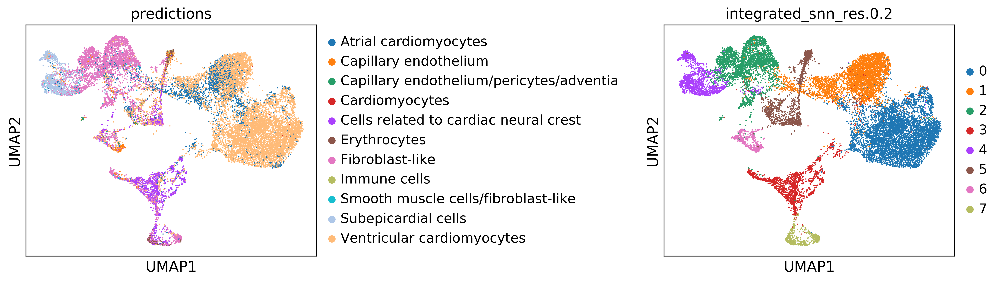

In [237]:
sc.pl.umap(biorep, color=['predictions', 'integrated_snn_res.0.2'], wspace=1)

In [232]:
biorep.obs.to_csv('meta.csv')

## Update color scheme

In [740]:
def color_tuple(adata, category):
    color_df = pd.DataFrame([list(color_vec) for color_vec in zip(list(adata.obs[category].cat.categories), adata.uns[category + '_colors'])], columns=[category, 'hex'])
    color_df = color_df.set_index(category)
    color_df['new_hex'] = 0
    return color_df

In [742]:
color_df = color_tuple(biorep, 'niceorder')

color_df.loc['Control'] = 'green'
color_df.loc['Het'] = 'red'
color_df.loc[['Homo']] = 'lightblue'
color_df.loc['WT'] = 'black'
# color_df.loc['Fibroblast-like'] = '#009193'
# color_df.loc[['Capillary endothelium/pericytes/adventia', 'Capillary endothelium', 'Smooth muscle cells/fibroblast-like', 'Immune cells', 'Erythrocytes']] = '#FFC000'

biorep.uns['niceorder_colors'] = color_df['new_hex'].tolist()

In [722]:
color_df = color_tuple(biorep, 'predictions')

color_df.loc['Subepicardial cells'] = '#FF7E79'
color_df.loc['Cells related to cardiac neural crest'] = '#A5A5A5'
color_df.loc[['Atrial cardiomyocytes', 'Cardiomyocytes']] = '#7030A0'
color_df.loc['Ventricular cardiomyocytes'] = '#D883FF'
color_df.loc['Fibroblast-like'] = '#009193'
color_df.loc[['Capillary endothelium/pericytes/adventia', 'Capillary endothelium', 'Smooth muscle cells/fibroblast-like', 'Immune cells', 'Erythrocytes']] = '#FFC000'

biorep.uns['predictions_colors'] = color_df['new_hex'].tolist()

In [728]:
biorep.obs.to_csv('meta.csv')

In [735]:
biorep.obs['integrated_snn_res.0.1'] = [str(x) for x in biorep.obs['integrated_snn_res.0.1'].tolist()]

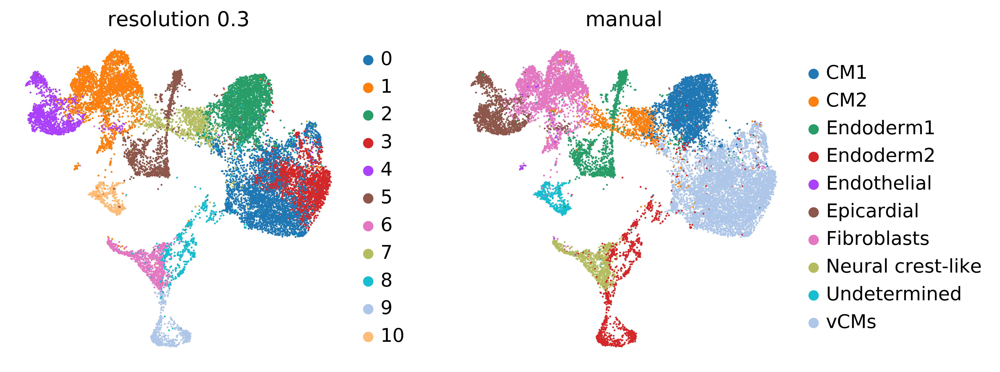

In [745]:
sc.pl.umap(biorep, color=['integrated_snn_res.0.3', 'manual'], frameon=False, title=['resolution 0.3', 'manual'])

## Confusion matrix

In [141]:
def add_manual_annotation(adata, setup_df, cell_type_df):
    
    confusion_setup_df = setup_df['integrated_snn_res.0.3'].to_frame()
    confusion_setup_df['integrated_snn_res.0.3'] = [str(x) for x in confusion_setup_df['integrated_snn_res.0.3'].tolist()]
    
    confusion_setup_df.loc[confusion_setup_df['integrated_snn_res.0.3'] == '4', 'manual'] = 'Epicardial'
    confusion_setup_df.loc[confusion_setup_df['integrated_snn_res.0.3'] == '1', 'manual'] = 'Fibroblasts'
    confusion_setup_df.loc[confusion_setup_df['integrated_snn_res.0.3'] == '5', 'manual'] = 'Endoderm1'
    confusion_setup_df.loc[confusion_setup_df['integrated_snn_res.0.3'] == '7', 'manual'] = 'CM2'
    confusion_setup_df.loc[confusion_setup_df['integrated_snn_res.0.3'] == '2', 'manual'] = 'CM1'
    confusion_setup_df.loc[confusion_setup_df['integrated_snn_res.0.3'] == '3', 'manual'] = 'vCMs'
    confusion_setup_df.loc[confusion_setup_df['integrated_snn_res.0.3'] == '0', 'manual'] = 'vCMs'
    confusion_setup_df.loc[confusion_setup_df['integrated_snn_res.0.3'] == '8', 'manual'] = 'Endoderm2'
    confusion_setup_df.loc[confusion_setup_df['integrated_snn_res.0.3'] == '9', 'manual'] = 'Endoderm2'
    confusion_setup_df.loc[confusion_setup_df['integrated_snn_res.0.3'] == '6', 'manual'] = 'Neural crest-like'
    confusion_setup_df.loc[confusion_setup_df['integrated_snn_res.0.3'] == '10', 'manual'] = 'Undetermined'
#     print(confusion_setup_df)
    for cell in cell_type_df['x'].tolist():
        confusion_setup_df.loc[confusion_setup_df.index == cell, 'manual'] = 'Endothelial'
        
    adata.obs['manual'] = confusion_setup_df['manual']

    setup_df['predictions'] = adata.obs['predictions']
    setup_df['manual'] = confusion_setup_df['manual']
    
    return adata, setup_df

def reorder_rows_and_columns(confusion_df):
    confusion_df = confusion_df[['vCMs', 'CM1', 'CM2', 'Fibroblasts', 'Epicardial', 'Neural crest-like','Endoderm1', 'Endoderm2', 'Endothelial', 'Undetermined']]
    confusion_df = confusion_df.reindex(['Ventricular cardiomyocytes', 'Atrial cardiomyocytes', 'Fibroblast-like', 'Subepicardial cells', \
                      'Cells related to cardiac neural crest' , 'Smooth muscle cells/fibroblast-like', 'Capillary endothelium/pericytes/adventia', 'Capillary endothelium', 'Erythrocytes',\
                      'Cardiomyocytes', 'Immune cells'])
    return confusion_df

def create_confusion_matrices(adata, setup_df):
    
    confusion_count_df = pd.DataFrame()
    confusion_percent_df = pd.DataFrame()
    for k,v in dict(collections.Counter([tuple(x) for x in setup_df[['predictions', 'manual']].values])).items():
        confusion_count_df.at[k[0], k[1]] = v
        confusion_percent_df.at[k[0], k[1]] = 100 * (v/setup_df.shape[0])
#     print(sum(confusion_percent_df.sum().tolist()))
    assert round(sum(confusion_percent_df.sum().tolist())) == 100.0
    
    adata.uns['confusion_count_df'] = reorder_rows_and_columns(confusion_count_df.fillna(0))
    adata.uns['confusion_percent_df'] = reorder_rows_and_columns(confusion_percent_df.fillna(0))
    adata = marginal_percent_tallies(adata)
    
    return adata

def marginal_percent_tallies(adata):
    
    # Row tally
    manual_percent_tally_df = pd.DataFrame()
    for man_classes in list(adata.uns['confusion_percent_df']):
        manual_percent_tally_df.at[man_classes, 'total_percent'] = adata.uns['confusion_percent_df'][man_classes].sum()
    
    # Column tally
    pred_percent_tally_df = pd.DataFrame()
    for pred_classes in adata.uns['confusion_percent_df'].index.tolist():
        pred_percent_tally_df.at[pred_classes, 'total_percent'] = adata.uns['confusion_percent_df'].loc[pred_classes].sum()
        
    adata.uns['confusion_man_per_tally'] = manual_percent_tally_df
    adata.uns['confusion_pred_per_tally'] = pred_percent_tally_df
    
    return adata

def confusion_df_setup(adata, cell_type_df):
    setup_df = adata.obs
    adata, setup_df = add_manual_annotation(adata, setup_df, cell_type_df)
    adata = create_confusion_matrices(adata, setup_df)    
    return biorep

In [140]:
endo_df = pd.read_csv('endothelial_barcodes.csv')
biorep = confusion_df_setup(biorep, endo_df)

(18896, 2)
{'vCMs', 'Neural crest-like', 'Endothelial', 'Undetermined', 'Endoderm2', 'CM2', 'Epicardial', 'Endoderm1', 'Fibroblasts', 'CM1'}


In [584]:
pred_vs_man_dict = dict(collections.Counter([tuple(pred) \
                                             for pred in biorep.obs[['predictions', 'manual']].values]))

pred_vs_man_df = pd.DataFrame()
pred_vs_man_avg_dict = {comp: biorep.obs.loc[(biorep.obs['predictions'] == comp[0]) &\
                                             (biorep.obs['manual'] == comp[1])]['probs'].mean()\
                        for comp in pred_vs_man_dict.keys()}

for k,v in pred_vs_man_avg_dict.items():
    pred_vs_man_df.at[k[0],k[1]] = v
    
pred_vs_man_df = reorder_rows_and_columns(pred_vs_man_df)

In [586]:
color_confusion_df = pred_vs_man_df.fillna(0)
confusion_df = biorep.uns['confusion_count_df']
# colors = cmap(color_confusion_df.values.flatten())

In [607]:
def create_coords(df):
    y, x = np.indices(df.shape)
    y = y.flatten()
    x = x.flatten()
    return x, y[::-1]

cmap = plt.get_cmap('Reds')
x,y = create_coords(confusion_df.transpose())

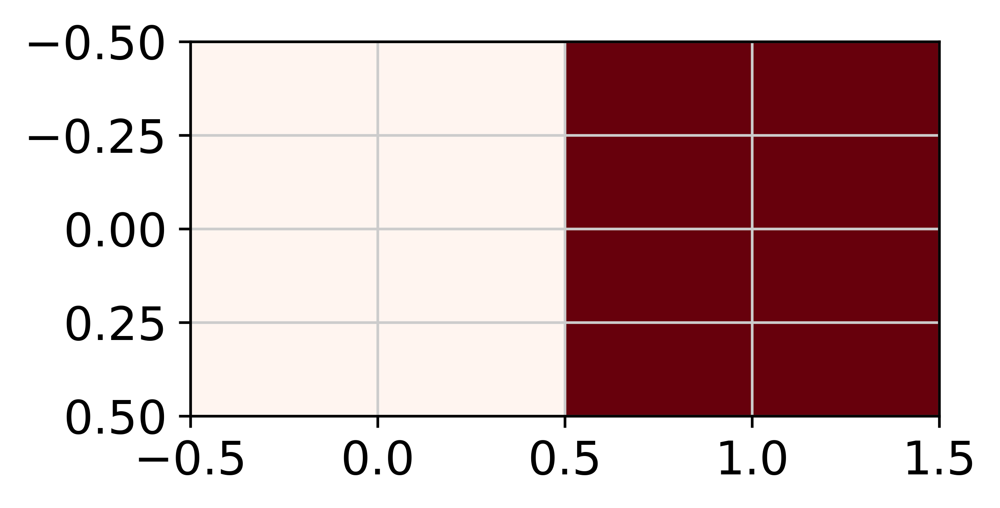

In [588]:
a = np.array([[0,1]])
# pl.figure(figsize=(9, 1.5))
img = plt.imshow(a, cmap="Reds")
# pl.gca().set_visible(False)
# cax = pl.axes([0.1, 0.2, 0.8, 0.6])
# pl.colorbar(orientation='horizontal', cax=cax)
# pl.savefig("colorbar.pdf")

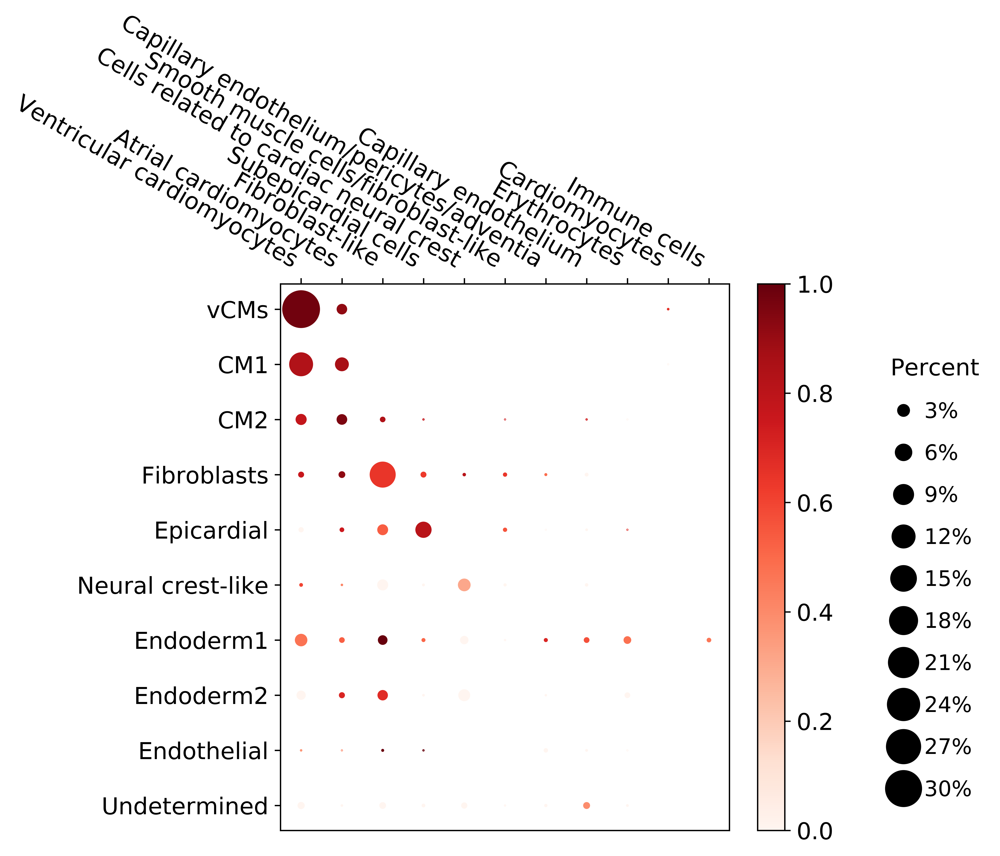

In [608]:
# 3, 10, 30
# confusion_df = confusion_df.transpose()
fig, ax = plt.subplots(figsize=(6, 6))
# 2500*(confusion_df.values/biorep.shape[0])
scatter=ax.scatter(x,y,s=1500 * confusion_df.transpose().values/biorep.shape[0], c=colors)
# plt.rcParams['xtick.bottom'] = plt.rcParams['xtick.labelbottom'] = False
# plt.rcParams['xtick.top'] = plt.rcParams['xtick.labeltop'] = True
# plt.rcParams.spines['top'] = plt.rcParams.spines['top'] = False
plt.grid(False)
ax.xaxis.tick_top() # x axis on top

# plt.gca().spines['right'].set_color('none')
# plt.gca().spines['bottom'].set_color('none')

# confusion_df.transpose().index.tolist()[::-1]
plt.yticks([y for y in range(confusion_df.transpose().shape[0])], confusion_df.transpose().index.tolist()[::-1])
plt.xticks([x for x in range(confusion_df.transpose().shape[1])], list(confusion_df.transpose()), rotation=-30, ha="right")
handles, labels = scatter.legend_elements(prop="sizes", \
                                          alpha=1, func=lambda s: 100 * (s/1500),\
                                         fmt=" {x:.0f}%")
# labels = [int(x)/2500 for x in labels]
legend1 = ax.legend(handles, labels, frameon=False, title="Percent", labelspacing= 1, bbox_to_anchor=(1.6,0.9))
a = np.array([[0,1]])
# pl.figure(figsize=(9, 1.5))
# img = plt.imshow(a, cmap="Reds")
fig.colorbar(img)
# plt.colorbar('reds')
# handles, labels = scatter.legend_elements(prop="colors")
# legend2= ax.legend(handles,labels)
# plt.colorbar(cm.ScalarMappable(cmap=colors))
# plt.show()
# for angle in range(0,360): 
#     ax.view_init(30,angle)
plt.savefig('confusion_dotplot.pdf', bbox_inches = "tight")

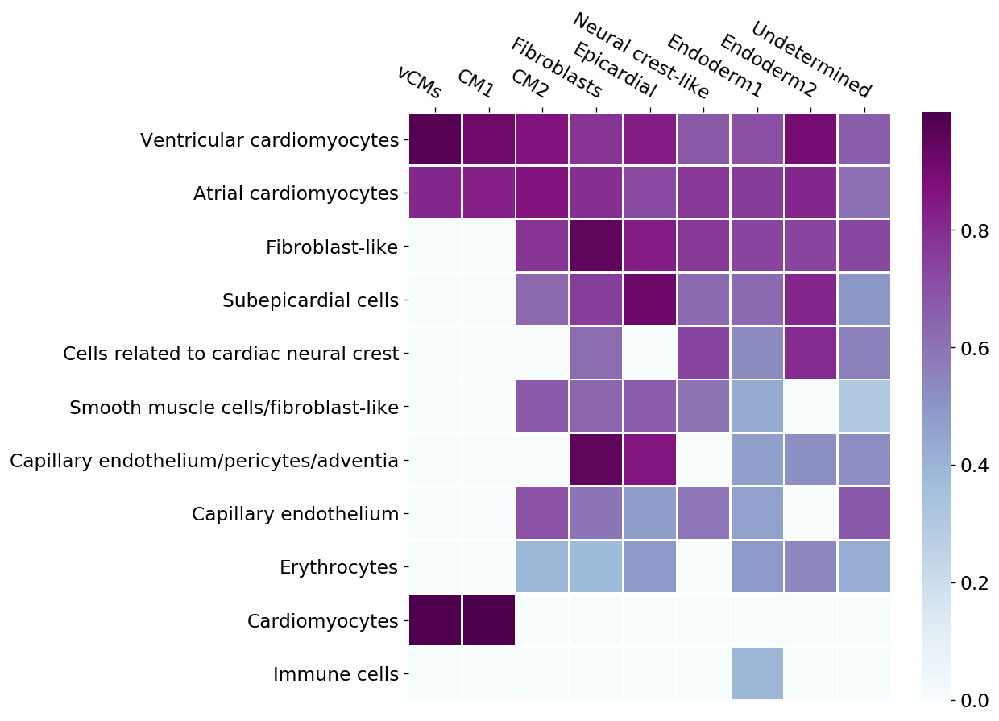

In [346]:
f, ax = plt.subplots(figsize=(8, 8))
cmap = sns.diverging_palette(200, 275, s=80, l=50, n=4)
# BuPu
#cmap=sns.cubehelix_palette(300, start=200, rot=0, dark=0, light=.95, reverse=True)
sns.heatmap(confusion_df, annot=False, fmt=".2f", linewidths=1, cmap='BuPu')
ax.xaxis.tick_top()
plt.setp(ax.get_xticklabels(), rotation=-30, ha="right",
             rotation_mode="anchor")
plt.show()

## 5.5 Were any mixed cells classified as doublets?

In [220]:
gem_doublet_dict = { doublet.split('_')[1] : pd.read_csv(doublet)['x'].tolist() for doublet in glob.glob('gem_*_doublet_cells.csv')}
doublet_cell_list = [item for sublist in list(gem_doublet_dict.values()) for item in sublist]
assert len(set(doublet_cell_list)) == len(doublet_cell_list)
biorep.obs['doublet_finder'] = ['doublet' if cell in doublet_cell_list else 'singlet'\
                         for cell in biorep.obs.index.tolist()]

In [227]:
print(len(doublet_cell_list))

443


In [221]:
for k,v in gem_doublet_dict.items():
    print(k, len(v))

6 127
1 241
4 75


In [609]:
# All ventricular and atrial
# biorep.obs[biorep.obs['predictions'].isin(['Ventricular cardiomyocytes', 'Atrial cardiomyocytes'])]

In [229]:
df = biorep.obs[['doublet_finder', 'nCount_RNA', 'manual', 'predictions', 'probs']]
df = df[df['doublet_finder'].isin(['doublet'])]

In [611]:
# collections.Counter([tuple(item) for item in df[['manual', 'predictions']].values.tolist()])
# collections.Counter(biorep.obs[biorep.obs.index.isin(mixed_cell_list)]['doublet_finder'])

In [715]:
data_df = biorep.obs
cell_df = pd.DataFrame(biorep.X.todense(),\
                       columns=biorep.var.index.tolist(),\
                       index=biorep.obs.index.tolist())
data_df.to_csv('data_df.csv')
cell_df.to_csv('cell_df.csv')

In [ ]:
# true_list = lunde.uns['cv_report']['0_prob_df']['true'].tolist()
# eval_dict = {cell_type:[x for x in range(len(true_list)) \
#                         if true_list[x]==cell_type]\
#              for cell_type in list(set(lunde.obs['celltype'].tolist()))}
# true = [lunde.uns['cv_report']['0_prob_df']['predicted'].tolist()[item] for item in eval_dict['Erythrocytes']]
# predicted = [true_list[item] for item in eval_dict['Erythrocytes']]

## DoubletFinder

In [32]:
gem_df = [pd.read_csv(x, index_col=[0]) for x in glob.glob('../Scripts/*.csv')]
df_ids = [i for x in gem_df for i in x.index.tolist()]
for df in gem_df:
    df.columns.values[1] = "df_classification"
x = []
for items in df_ids:
    if items in biorep.obs.index.tolist():
        x.append(items)
print(len(x))

18896


In [47]:
doublet_df = pd.concat(gem_df)
biorep.obs['df_classification']=doublet_df.reindex(biorep.obs.index.tolist())['df_classification'].tolist()

In [48]:
biorep.obs['mixed'] = 'not mixed'
biorep.obs.loc[[i for x in mixed_cells['rep_2'] for i in x],'mixed'] = 'mixed'

In [49]:
biorep.obs['df_mixed'] = biorep.obs[['df_classification', 'mixed']].agg('-'.join, axis=1)

... storing 'mixed' as categorical
... storing 'df_mixed' as categorical


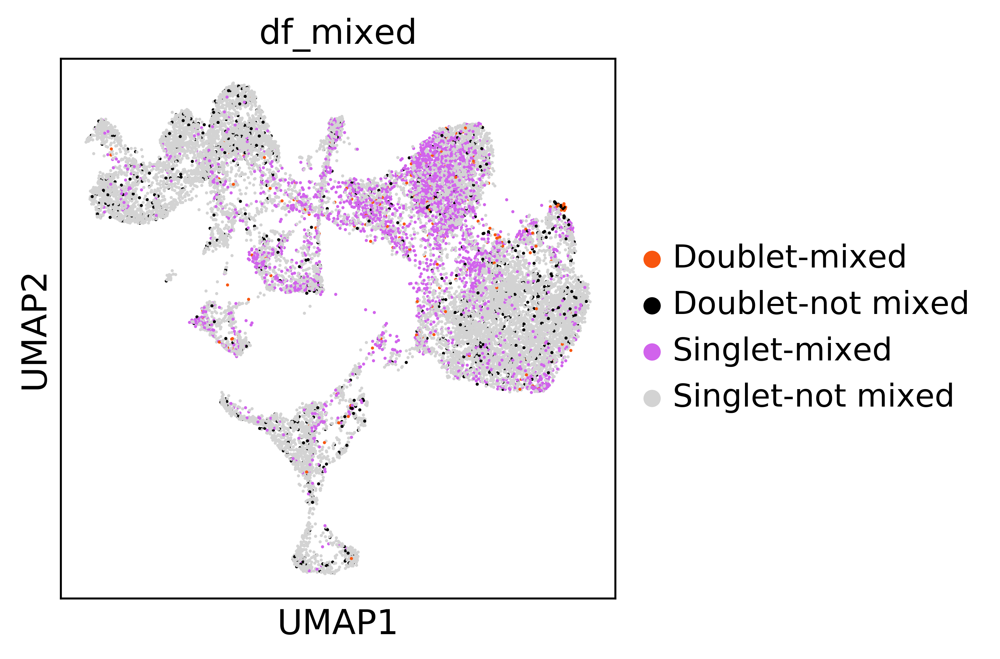

In [46]:
# mixed/doublet- orange, mixed/singlet- bright purple, not mixed/singlet- grey, not mixed/doublet- black
# purple more blue
# orange more red
sc.pl.umap(biorep, color=['df_mixed'], palette=['#F8550E','black', '#D163EC','lightgrey'])

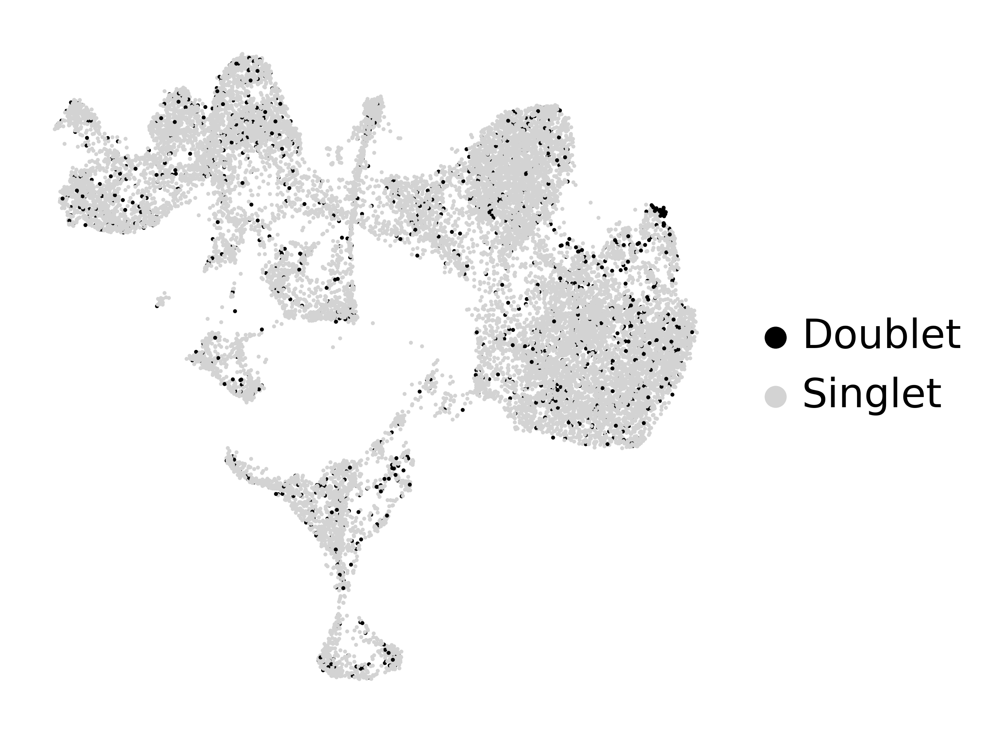

In [108]:
sc.pl.umap(biorep,color=['df_classification'], palette=['black','lightgrey'], frameon=False, title='', save='_df.pdf')

In [7]:
meta = pd.read_csv('biorep_meta_v2.csv',index_col=[0])

/opt/conda/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3051: DtypeWarning: Columns (8) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [6]:
# meta

In [18]:
# mixed- dark purple, not mixed- black
# combine (three cat.), mixed/doublet- orange, mixed-singlet- bright purple, not mixed/singlet- grey, not mixed/doublet- black
sc.pl.umap(biorep, color=['mixed'],palette=['#3C2415','lightgrey'], frameon=False, title='', palette=['#3C2415'], save='_mixed.pdf')

SyntaxError: keyword argument repeated (<ipython-input-18-932b4839a07b>, line 3)

## Mixed cells

In [67]:
def doublet_percentages(dict_1, dict_2, key_1, key_2):
    print(dict_1[key_1]/dict_2[key_2])
dict_1 = dict(collections.Counter([tuple(x) for x in biorep.obs[['niceorder','df_classification', 'mixed', 'predictions']].values]))
dict_2 = dict(collections.Counter([tuple(x) for x in biorep.obs[['df_classification', 'mixed', 'predictions']].values]))

In [51]:
for k,v in dict(collections.Counter([tuple(x) for x in biorep.obs[['predictions', 'mixed']].values])).items():

    if k[0] in ['Ventricular cardiomyocytes', 'Atrial cardiomyocytes']:
        print(k,v)

('Ventricular cardiomyocytes', 'not mixed') 7387
('Ventricular cardiomyocytes', 'mixed') 2283
('Atrial cardiomyocytes', 'not mixed') 624
('Atrial cardiomyocytes', 'mixed') 1122


In [ ]:
# doublet not mixed vCM
100*(569/7387)

In [52]:
# vcm not mixed wt
100*(215/7387)

2.9105184784080143

In [53]:
# vcm not mixed het
100*(177/7387)

2.396101258968458

In [54]:
# vcm not mixed hom
100*(115/7387)

1.5567889535670774

In [55]:
# vcm not mixed control
100*(62/7387)

0.8393123054013808

In [ ]:
# doublet not mixed atrial
100* (47/624)

In [71]:
# acm not mixed wt
100*(8/624)

1.282051282051282

In [72]:
# acm not mixed het
100*(16/624)

2.564102564102564

In [73]:
# acm not mixed hom
100*(22/624)

3.5256410256410255

In [75]:
# acm not mixed control
100*(1/624)

0.16025641025641024

In [70]:
for k, v in collections.Counter([tuple(x) for x in biorep.obs[['niceorder','df_classification', 'mixed', 'predictions']].values]).items():
    if k[-1] in ['Atrial cardiomyocytes', 'Ventricular cardiomyocytes']:
        if k[-2] == 'not mixed':
            if k[1] == 'Doublet':
                print(k,v)

('WT', 'Doublet', 'not mixed', 'Ventricular cardiomyocytes') 215
('WT', 'Doublet', 'not mixed', 'Atrial cardiomyocytes') 8
('Control', 'Doublet', 'not mixed', 'Ventricular cardiomyocytes') 62
('Control', 'Doublet', 'not mixed', 'Atrial cardiomyocytes') 1
('Het', 'Doublet', 'not mixed', 'Ventricular cardiomyocytes') 177
('Het', 'Doublet', 'not mixed', 'Atrial cardiomyocytes') 16
('Homo', 'Doublet', 'not mixed', 'Ventricular cardiomyocytes') 115
('Homo', 'Doublet', 'not mixed', 'Atrial cardiomyocytes') 22


In [ ]:
# doublet mixed atrial + ventricular
100 * (88 + 146)/(2283+1122)

In [66]:
# Doublet mixed Hom:
100*(74+37)/(2283+1122)

3.2599118942731278

In [67]:
# Doublet mixed Het:
100*(33+25)/(2283+1122)

1.7033773861967694

In [68]:
# Doublet mixed WT:
100*(33+25)/(2283+1122)

1.7033773861967694

In [69]:
100*(6+1)/(2283+1122)

0.2055800293685756

In [ ]:
# for k, v in collections.Counter([tuple(x) for x in biorep.obs[['df_classification', 'mixed', 'predictions']].values]).items():
#     if k[-1] in ['Ventricular cardiomyocytes', 'Atrial cardiomyocytes']:
#         print(k,v)

In [86]:
100*(439/(5870))

7.478705281090289

In [81]:
collections.Counter([x for x in biorep.obs['niceorder']])

Counter({'WT': 5870, 'Control': 2174, 'Het': 5019, 'Homo': 5833})

In [78]:
collections.Counter([tuple(x) for x in biorep.obs[['niceorder', 'df_classification']].values])

Counter({('WT', 'Doublet'): 439,
         ('WT', 'Singlet'): 5431,
         ('Control', 'Doublet'): 164,
         ('Control', 'Singlet'): 2010,
         ('Het', 'Doublet'): 378,
         ('Het', 'Singlet'): 4641,
         ('Homo', 'Doublet'): 439,
         ('Homo', 'Singlet'): 5394})

In [56]:
collections.Counter([tuple(x) for x in biorep.obs[['predictions', 'mixed']].values])

Counter({('Fibroblast-like', 'not mixed'): 4311,
         ('Ventricular cardiomyocytes', 'not mixed'): 7387,
         ('Subepicardial cells', 'not mixed'): 1116,
         ('Ventricular cardiomyocytes', 'mixed'): 2283,
         ('Atrial cardiomyocytes', 'not mixed'): 624,
         ('Atrial cardiomyocytes', 'mixed'): 1122,
         ('Capillary endothelium/pericytes/adventia', 'not mixed'): 84,
         ('Smooth muscle cells/fibroblast-like', 'not mixed'): 77,
         ('Erythrocytes', 'not mixed'): 250,
         ('Immune cells', 'not mixed'): 40,
         ('Capillary endothelium', 'not mixed'): 253,
         ('Cells related to cardiac neural crest', 'not mixed'): 1339,
         ('Cardiomyocytes', 'not mixed'): 5,
         ('Fibroblast-like', 'mixed'): 2,
         ('Capillary endothelium/pericytes/adventia', 'mixed'): 2,
         ('Erythrocytes', 'mixed'): 1})